#Importing Modules

In [133]:
# importing the opencv version 2 module
import cv2

In [134]:
# importing pyplot from matplotlib to plot and show histograms
from matplotlib import pyplot as plt

In [135]:
# mounting google drive for accessing the images
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [136]:
# cv2.imshow is disabled in google colab since it crashes jupyter sessions
# alternative provided by google colab is cv2_imshow
from google.colab.patches import cv2_imshow

#1. Reading, displaying and printing the shape of an image

In [137]:
# reading a .jpg file from my drive into variable which stands for original image
image = cv2.imread('/content/drive/MyDrive/Z/KanakYadav1.jpg', cv2.IMREAD_COLOR)
# scaling down the image to reduce the size of this notebook
# source: https://learnopencv.com/image-resizing-with-opencv/
# assigning a scaling factor for the image
scaling_factor = 0.25
# cv2.resize() returns the new image array afer resizing the source image
orgimg = cv2.resize(image, None, fx = scaling_factor, fy = scaling_factor)

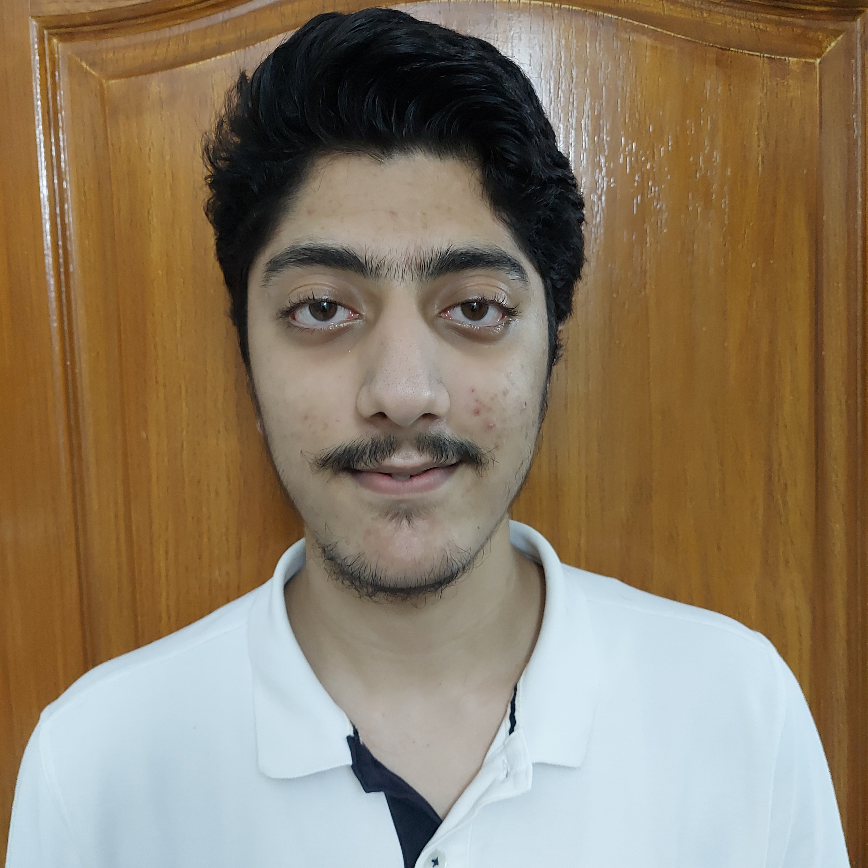

In [138]:
# showimg/printing/displaying of the image
cv2_imshow(orgimg)

In [139]:
# .shape returns the dimensions (height and width) of the image in pixels and the number of channels (colors used -> RGB, hence 3)
print(orgimg.shape)

(868, 868, 3)


The dimensions correspond to the height and width of the image in pixels in that order, i.e. orgimg.shape[0] = height, orgimg.shape[1] = width and orgimg.shape[2] = no. of values stored for each pixel. Grayscale images store only one value for each pixel, however printing the shape of such an image will contain only the height and width and not the no. of channels

#2. Pixel Intensities

In [140]:
# used slicing for displaying the intensities of all 3 colors in [Blue Green Red] order for a window of pixels
print(orgimg[860:, 100:105, :])

[[[212 199 177]
  [208 195 173]
  [207 194 172]
  [206 195 173]
  [204 191 169]]

 [[208 195 173]
  [207 194 172]
  [211 198 175]
  [205 194 172]
  [206 193 172]]

 [[209 196 174]
  [209 196 174]
  [206 193 171]
  [206 194 172]
  [207 194 172]]

 [[210 196 174]
  [208 195 173]
  [208 195 173]
  [208 195 173]
  [207 194 172]]

 [[210 196 176]
  [208 196 172]
  [212 199 176]
  [207 194 172]
  [208 195 173]]

 [[212 199 177]
  [208 196 173]
  [208 196 173]
  [205 192 170]
  [207 194 172]]

 [[210 197 175]
  [211 198 175]
  [207 194 171]
  [207 194 172]
  [207 194 172]]

 [[210 197 175]
  [208 196 172]
  [207 194 171]
  [207 194 172]
  [204 191 169]]]


The window I have chosen has high values for 1 dimension and low values for the other. Hence, the possible locations of the window are the top-right and the bottom-left. The pixel intensities for all three colors is high suggesting a bright portion. But in orgimg top-right is brownish color and bottom-left is a ehite cloth. Thus, we conclude that the dimensions are represented as (height, width) and that the origin of the image is the top-left.

#3. Overwriting 255

In [141]:
# creating a copy of the image so orgimg array is preserved
overwrite_255 = orgimg.copy()
# assigning/overwriting the value 255 to a portion of pixels
overwrite_255[50:250, 100:350, :] = 255

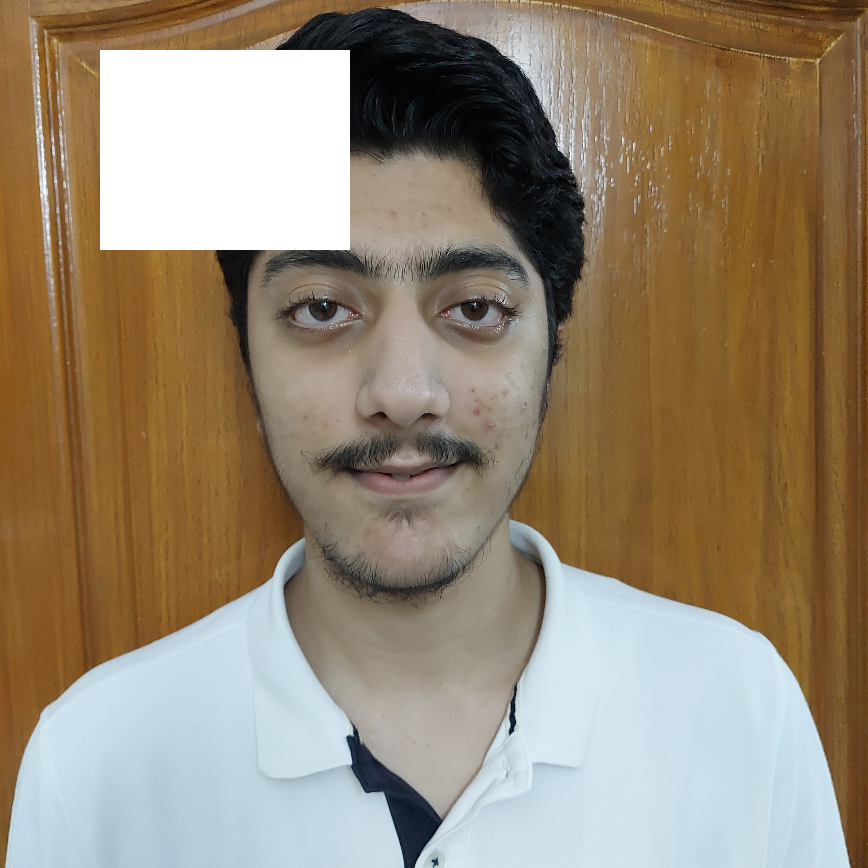

In [142]:
# displaying the image with overwritten values
cv2_imshow(overwrite_255)

The result was expected as we denote high intensities with white and low with black.

#4. Overwriting 256

In [143]:
# creating a copy of the image so orgimg array is preserved
overwrite_256 = orgimg.copy()
# assigning/overwriting the value 255 to a portion of pixels
overwrite_256[50:250, 100:350, :] = 256

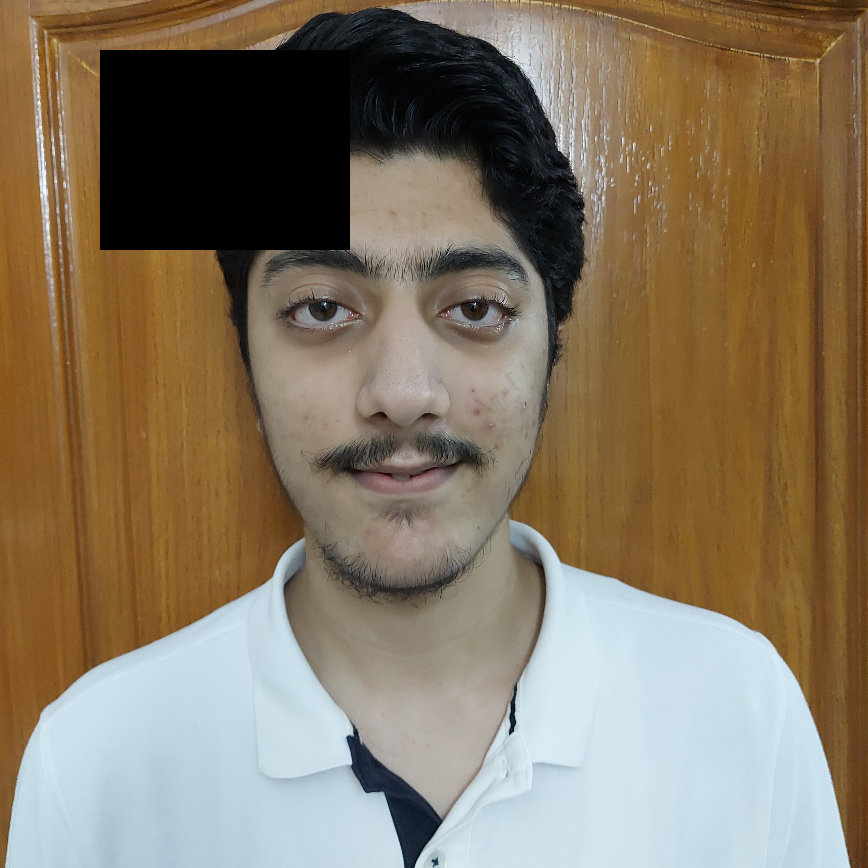

In [144]:
# displaying the image with overwritten values
cv2_imshow(overwrite_256)

It may appear baffling at first that the values above the highest intensity (255) are not being clipped. However, after printing the pixel intensities of these pixels we find that the value assigned to the pixel when overwriting it with x is x % 256 (the remainder of x with 256) which basically means a wraparound from 0 to 255 and again 0 to 2...

#5. Cropping

In [145]:
# assigning the number of pixels to crop from each side
to_crop = 50
# creating the cropped image by using slicing on the original image array
# orgimg.shape[0] is the height which is taken as the X-Axis and orgimg.shape[1] is the width waken as the Y-Axis
# cropped to_crop pixels from all sides and saved the result into a new image array
crppdimg = orgimg[to_crop:orgimg.shape[0]-to_crop, to_crop:orgimg.shape[0]-to_crop]

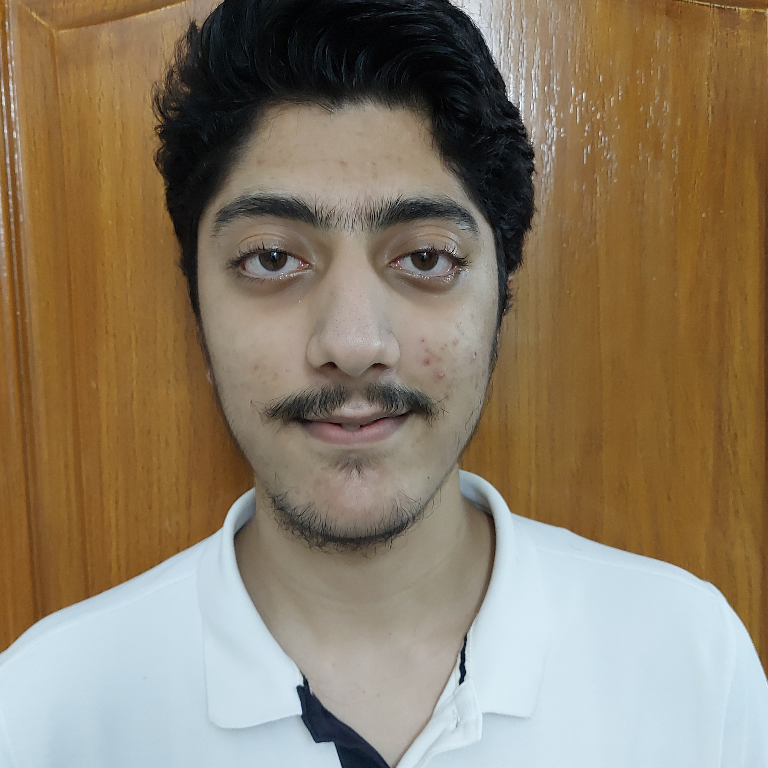

In [146]:
# displaying the cropped image
cv2_imshow(crppdimg)

In [147]:
# checking the dimensions of the cropped image for verification
print(crppdimg.shape)

(768, 768, 3)


#6. Saving

In [148]:
# saving the image in the local directory of google colab
# cv2.imwrite returns True if the image is saved succesfully
# printing and checking in the local storage for verification
print('Image Saved' if cv2.imwrite('croppedimage.png', crppdimg) else 'Image Not Saved')

Image Saved


#7. Adding 50

In [149]:
# new image array to preserve original
add50 = orgimg.copy()

In [150]:
# adding 50 as an array operation i.e. adding 50 to every element (RGB values of every pixel) of the array
# x += y is the shorthand for x = x + y i.e. overwriting x + y to x
add50 += 50

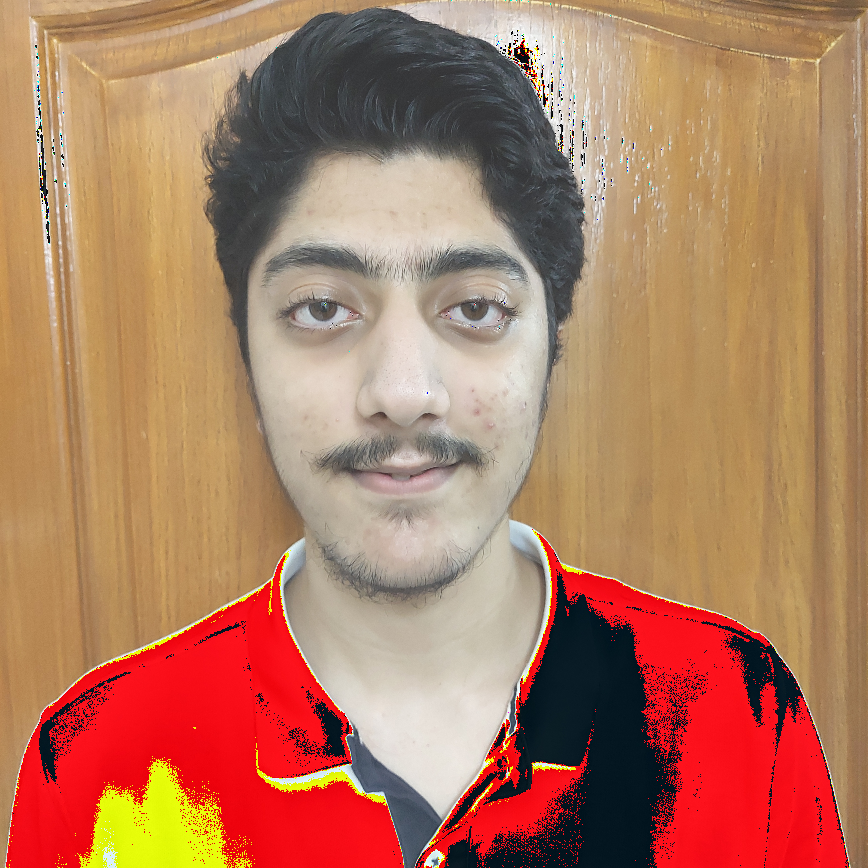

In [151]:
# displaying the resultant image
cv2_imshow(add50)

Clearly, this the work of the modulo operator. Mostly the brighter pixels were affected as their pixel values were closer to max. Adding 50 to these values, made the colors that went above 255 have low intensity compared to those that were sufficiently farther. As we can see that the t-shirt is now mostly red because the blue and green vallues went over 256 and got wrapped around to lower values. If the values didn't go beyond 256, then that pixel just became brighter and more intense (in terms of its value increasing) than before.

#8. Inverting Y-axis

In [152]:
# new image array
mirrorimg = orgimg.copy()

In [153]:
# used slicing to reverse the order of the pixels along the Y-Axis
# [start:stop:step] if since step is negative and -1 represents the last element, the list/array is reversed in order
# say list = [1, 2, 3, 4] then, list[::-1] = [4, 3, 2, 1]
mirrorimg = mirrorimg[:, : :-1]

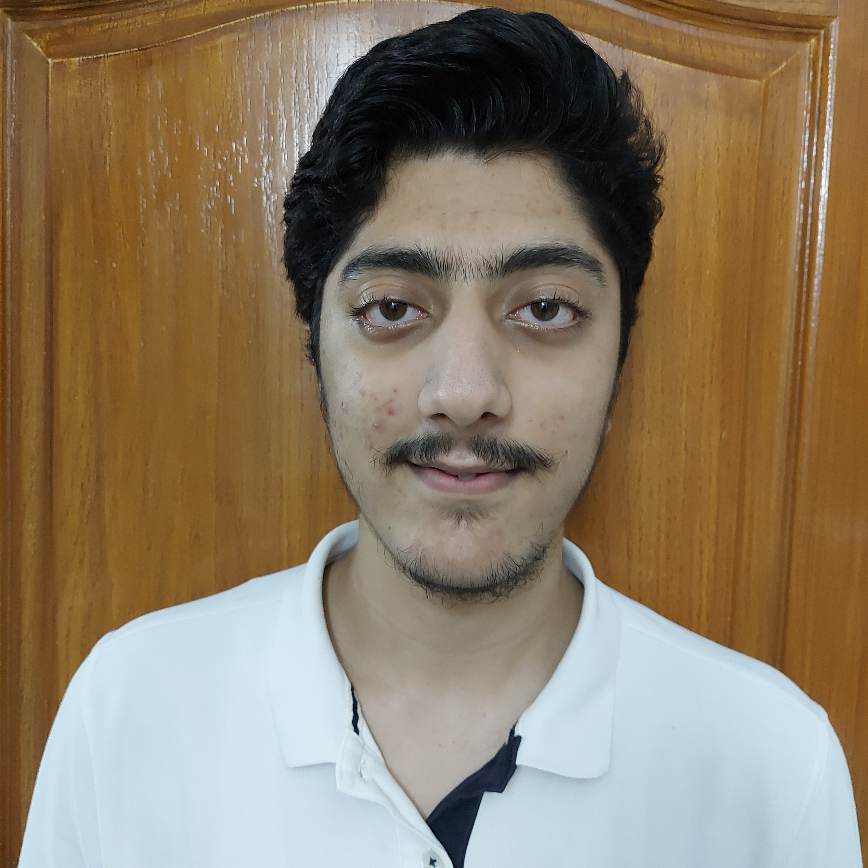

In [154]:
# displaying the mirror image
cv2_imshow(mirrorimg)

#9. Histogram

In [155]:
# the argument cv2.IMREAD_GRAYSCALE of cv2.imread() converts the image to grayscale
_ = cv2.imread('/content/drive/MyDrive/Z/KanakYadav2.jpg', cv2.IMREAD_GRAYSCALE)
# scaling down the image to reduce the size of this notebook
# source: https://learnopencv.com/image-resizing-with-opencv/
grayimg = cv2.resize(_, None, fx = scaling_factor, fy = scaling_factor)

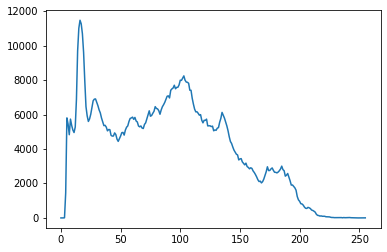

In [156]:
# source: https://www.geeksforgeeks.org/opencv-python-program-analyze-image-using-histogram/
# assigning hist1 the frequency of pixels in range 0-255 in that order
hist1 = cv2.calcHist([grayimg], [0], None, [256], [0, 256])
# show the histogram using the index array[0,1,...255] as x arguments
plt.plot(hist1)
plt.show()

#10. Brightening

In [157]:
# new image array
brghtndimg = grayimg.copy()

In [158]:
# after trying out value of a from [1.1, 1.2,..., 2] I chose 1.2
a = 1.2
# multiplying as an array operation
brghtndimg = grayimg*a

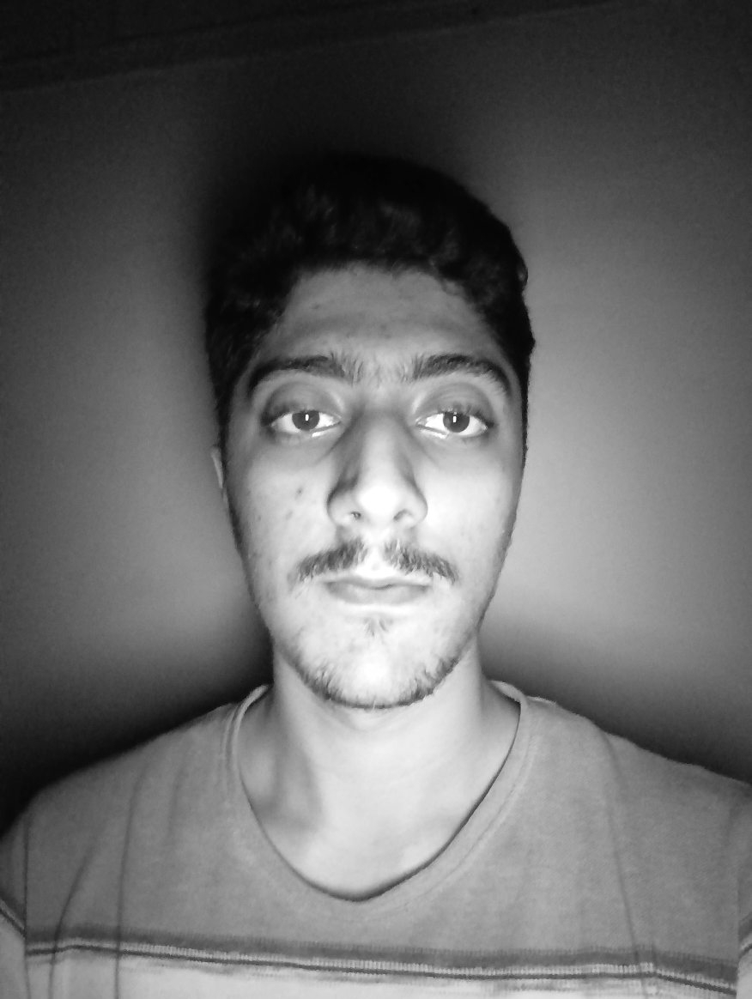

In [159]:
# displaying thee brightened image
cv2_imshow(brghtndimg)

#11. Power Transform

In [160]:
# after trying gamma from [.3, .35,..., .85] I chose .75
# all values of gamma tried are < 1 since the brighter parts of the image need enhancement (according to me)
gamma = 0.75
# taking c as L-1 because....
c = 255
# r has values in 0 to 1, and so is it raised to any exponent thus mulitplying with c will assign intensity values within the correct range
r = grayimg/255
# power-law transform
gammaimg = c*(r**gamma)

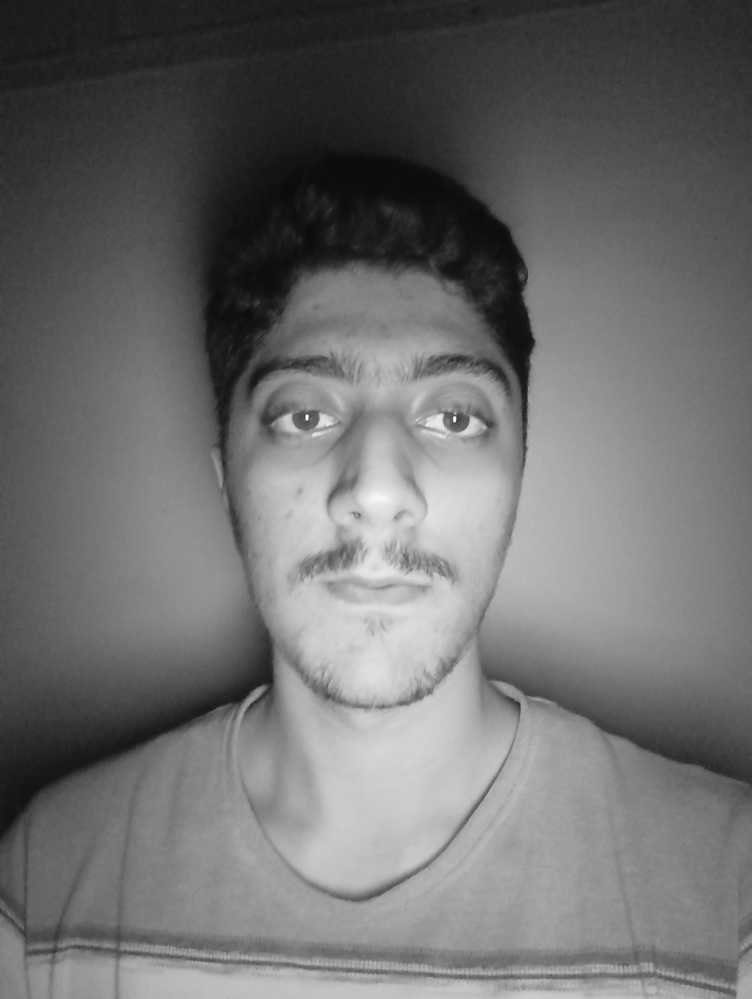

In [161]:
# displaying the transformed image
cv2_imshow(gammaimg)

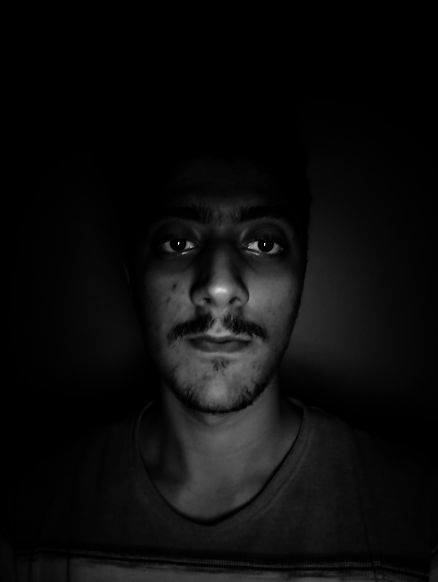

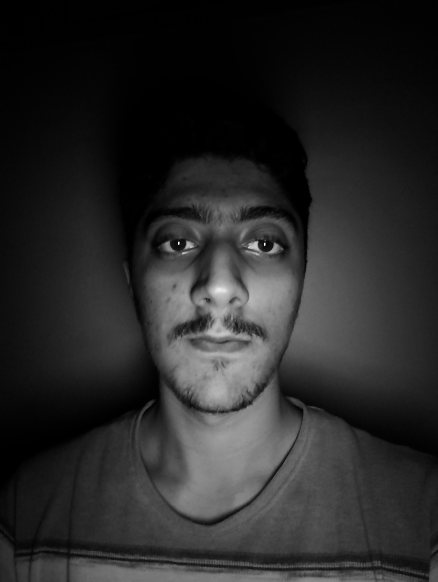

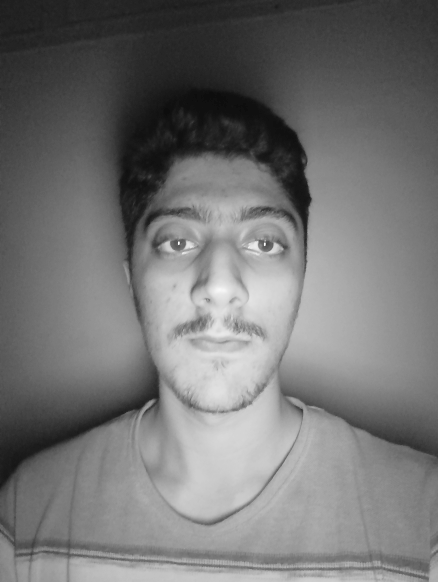

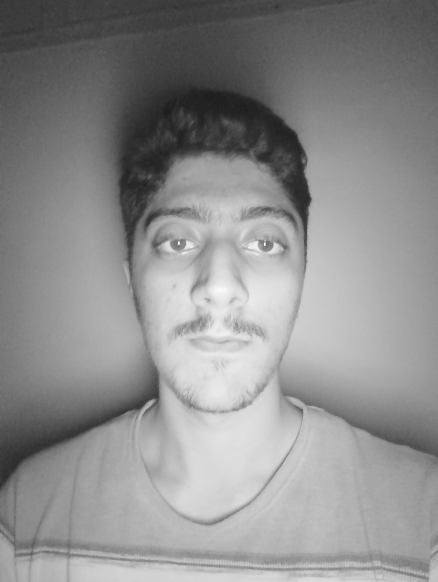

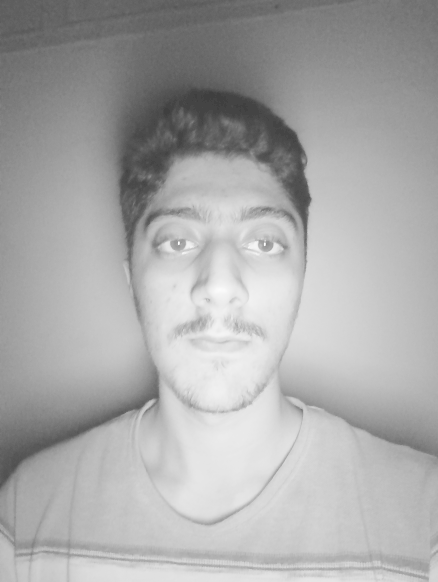

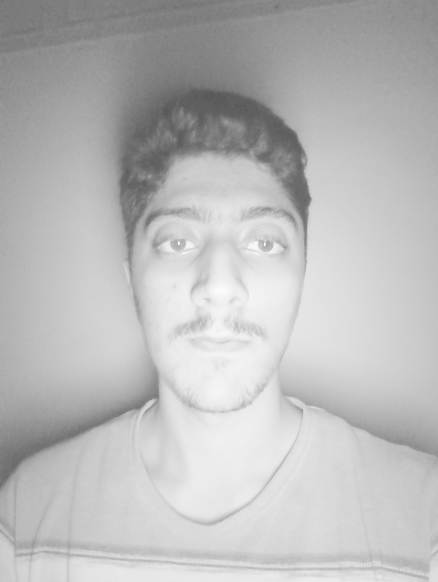

In [162]:
# displaying the power transform with values of gamma other than the one selected
scale_to = 0.5
gimage = cv2.resize(grayimg, None, fx = scale_to, fy = scale_to) / 255
glist = [4, 2, 0.7, 1/2, 1/3, 1/4]
gimages = []
for g in glist:
  gimages.append(c*(gimage**g))
for i in range(len(glist)):
  cv2_imshow(gimages[i])

#12. Histogram Equalization

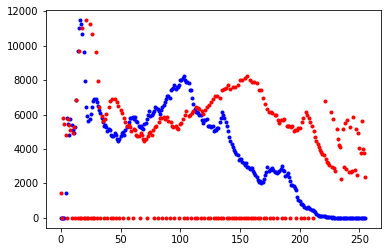

In [163]:
# source: https://www.geeksforgeeks.org/histograms-equalization-opencv/
# equalizeHist() returns the image obtained after histogram equalization
_ = cv2.equalizeHist(grayimg)
# calculating the histogram
hist2 = cv2.calcHist([_], [0], None, [256], [0, 256])
# plotting and showing the histogram
plt.plot(hist1, 'b.', hist2, 'r.')
plt.show()

Ideally there are an infinite number of intensity levels and the histogram is continuous. But practically, we need to discretize the intensity levels which makes the histogram discrete as well. Histogram equalization maps intensity levels of the source image to new intensity levels, in order to spread the histogram to all intensities. Since whole intensity levels are mapped, this means that all the pixels having that intansity are all mapped together to the same or another intensity level. This means that there would definately be intensity levels that are left-out. I have plotted the histogram using dot markers whicmakes it easier to see that quite a few intensities have zero pixels. Hence, the equalized histogram isn't flat.

#13. Histogram Specification

In [164]:
# target histogram: histogram of the first image
# source: https://www.geeksforgeeks.org/python-grayscaling-of-images-using-opencv/
# cv2.cvtColor converts the color space and returns the new image array
t_img = cv2.cvtColor(orgimg, cv2.COLOR_BGR2GRAY)
# calculating normalzed and equalized histograms of both target and source images
norm_t_hist = cv2.calcHist([cv2.equalizeHist(t_img)], [0], None, [256], [0, 256]) / t_img.size * 255
norm_s_hist = hist2 / grayimg.size * 255
# calculating the cumulative distribution function of the histograms that will allow us to map intensity levels of the source image to those of the target image
# the histograms consist of length 1 arrays hence used int()
t_cdf = [int(norm_t_hist[0])]
s_cdf = [int(norm_s_hist[0])]
for i in range(255):
    t_cdf.append(t_cdf[i] + int(norm_t_hist[i+1]))
    s_cdf.append(s_cdf[i] + int(norm_s_hist[i+1]))

In [165]:
# matched_hist is the map from source intensity level to target intensity level
matched_hist = []
# for every element of s_cdf, dist will contain its absolute distances from the t_cdf values
for i in s_cdf:
  dist = [abs(j - i) for j in t_cdf]
  # the exact value will have dist[i] = 0
  # the following maps to the exact value if it exists
  if 0 in dist:
    matched_hist.append(dist.index(0))
  else:
    # assigning a list of ascending distances
    shortest = sorted(dist)
    # finding the first occurence of the shortest distance, hence mapping to the lower of the two equidistant intensity levels if they exist
    matched_hist.append(dist.index(shortest[0]))

In [166]:
# assigning the matched image array with the source image first
matched_img = grayimg.copy()
# the following nested for loop does the actual transformation on the image
for i in range(matched_img.shape[0]):
  for j in range(matched_img.shape[1]):
    # replacing an existing intensity level with its mapped value in matched_hist
    matched_img[i, j] = matched_hist[matched_img[i, j]]

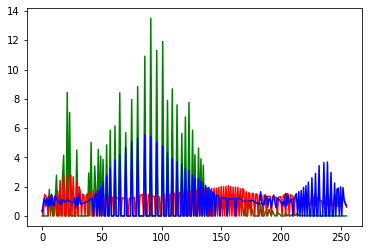

In [167]:
# calculating the normalized histogram of the histogram matched image
m_hist = cv2.calcHist([matched_img], [0], None, [256], [0, 256])/matched_img.size * 255
# plotting the three normalized histograms for comparison
plt.plot(m_hist, 'g-', norm_s_hist, 'r-', norm_t_hist, 'b-')
plt.show()

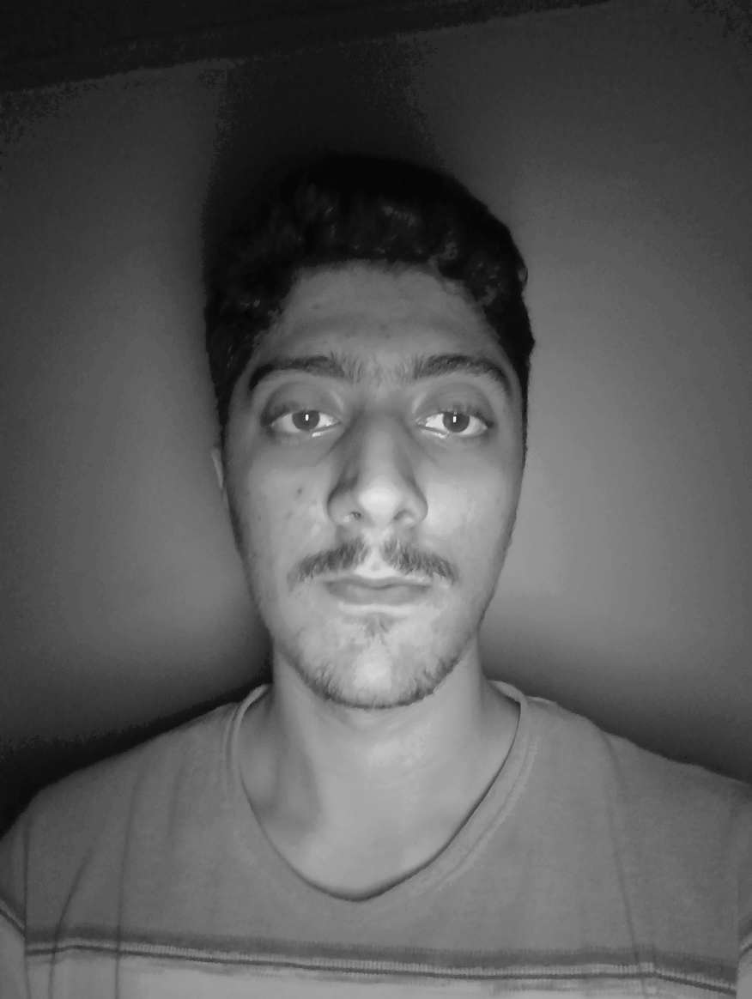

In [168]:
# displaying the histogram matched image
cv2_imshow(matched_img)

#Sources of Inspiration and Information
A great help in the histogram matching question were the following articles (sources of inspiration not copying): https://towardsdatascience.com/histogram-matching-ee3a67b4cbc1 ; https://theailearner.com/2019/04/10/histogram-matching-specification/ ;
And a go-to place for discovering the various methods/functions in the opencv image processing library was this tutorial (although I haven't completed it): https://www.geeksforgeeks.org/opencv-python-tutorial/